In [1]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
suvroo_ai_for_sustainable_agriculture_dataset_path = kagglehub.dataset_download('suvroo/ai-for-sustainable-agriculture-dataset')

print('Data source import complete.')


100%|██████████| 1.38M/1.38M [00:00<00:00, 68.6MB/s]

Extracting files...
Data source import complete.


**Introduction**

Sustainable agriculture is more than a farming method—it’s a strategic approach to feeding the world while preserving the environment, supporting local communities, and ensuring long-term productivity. In the era of digital transformation, data insights are becoming critical to achieving these goals. By harnessing data from sensors, satellites, farm equipment, and climate models, stakeholders can make informed decisions that promote sustainability, improve yield, and minimize environmental impact. This intersection of agriculture and data science opens new opportunities to enhance efficiency, reduce waste, and create resilient food systems for the future.



In [5]:
# Imports and Setup
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd

import matplotlib
matplotlib.use('Agg')  # Ensure non-interactive plotting when using matplotlib

import matplotlib.pyplot as plt
plt.switch_backend('Agg')  # If only plt is imported, we switch backend to 'Agg'

import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error, confusion_matrix

# Ensure inline plotting for Kaggle notebooks
%matplotlib inline

# Set plot style for consistency
sns.set(style='whitegrid')

print('Imports and setup complete.')

Imports and setup complete.


In [7]:
# Data Loading and Exploration - Market Researcher Data

# Read the market researcher dataset
# Note: Ensure that the file path is correct. We use encoding='ascii' as specified.
market_df = pd.read_csv('/content/market_researcher_dataset.csv', encoding='ascii', delimiter=',')

# Display the first few rows to verify the data loaded correctly
print('Market Researcher Dataset Sample:')
print(market_df.head())

# Quick summary of the dataset
print('\nMarket Researcher Dataset Info:')
print(market_df.info())

# Verify the data types
print('\nMarket Researcher Dataset Data Types:')
print(market_df.dtypes)

Market Researcher Dataset Sample:
   Market_ID  Product  Market_Price_per_ton  Demand_Index  Supply_Index  \
0          1     Rice            180.251212    196.085900    199.509124   
1          2     Rice            420.527970    188.452400    150.789483   
2          3    Wheat            457.260398    171.179384     78.989326   
3          4  Soybean            237.179113    196.970677     50.464363   
4          5    Wheat            324.032925    113.165416    145.878647   

   Competitor_Price_per_ton  Economic_Indicator  Weather_Impact_Score  \
0                300.549219            1.093636             28.474810   
1                492.097798            0.526307             70.978063   
2                323.003342            1.292393             80.853592   
3                232.978384            0.627663             60.676069   
4                312.428652            1.491255             45.379516   

  Seasonal_Factor  Consumer_Trend_Index  
0          Medium            148.4

In [8]:
# Data Loading and Exploration - Farmer Advisor Data

# Read the farmer advisor dataset
farmer_df = pd.read_csv('/content/farmer_advisor_dataset.csv', encoding='ascii', delimiter=',')

# Display the first few rows to verify the data loaded correctly
print('Farmer Advisor Dataset Sample:')
print(farmer_df.head())

# Quick summary of the dataset
print('\nFarmer Advisor Dataset Info:')
print(farmer_df.info())

# Verify the data types
print('\nFarmer Advisor Dataset Data Types:')
print(farmer_df.dtypes)

Farmer Advisor Dataset Sample:
   Farm_ID   Soil_pH  Soil_Moisture  Temperature_C  Rainfall_mm Crop_Type  \
0        1  7.073643      49.145359      26.668157   227.890912     Wheat   
1        2  6.236931      21.496115      29.325342   244.017493   Soybean   
2        3  5.922335      19.469042      17.666414   141.110521      Corn   
3        4  6.845120      27.974234      17.188722   156.785663     Wheat   
4        5  6.934171      33.637679      23.603899    77.859362      Corn   

   Fertilizer_Usage_kg  Pesticide_Usage_kg  Crop_Yield_ton  \
0           131.692844            2.958215        1.576920   
1           136.370492           19.204770        3.824686   
2            99.725210           11.041066        1.133198   
3           194.832396            8.806271        8.870540   
4            57.271267            3.747553        8.779317   

   Sustainability_Score  
0             51.913649  
1             47.159077  
2             50.148418  
3             89.764557  
4  

**Data Cleaning and Preprocessing**

In sustainable agriculture, high-quality data is essential for generating accurate insights and making informed decisions. However, raw agricultural data—whether collected from IoT sensors, weather stations, drones, or farm records—is often incomplete, inconsistent, or noisy. Data cleaning and preprocessing play a crucial role in transforming this raw data into a reliable foundation for analysis.

In [9]:
# Check for missing values in the market researcher dataset
print('Missing values in Market Researcher Dataset:')
print(market_df.isnull().sum())

# For the purpose of this notebook, we assume minimal missing values

# Check for missing values in the farmer advisor dataset
print('\nMissing values in Farmer Advisor Dataset:')
print(farmer_df.isnull().sum())

# For demonstration, if any missing value is encountered, one could fill them using:
# farmer_df.fillna(farmer_df.mean(), inplace=True)  # This is only applicable for numeric columns

Missing values in Market Researcher Dataset:
Market_ID                   0
Product                     0
Market_Price_per_ton        0
Demand_Index                0
Supply_Index                0
Competitor_Price_per_ton    0
Economic_Indicator          0
Weather_Impact_Score        0
Seasonal_Factor             0
Consumer_Trend_Index        0
dtype: int64

Missing values in Farmer Advisor Dataset:
Farm_ID                 0
Soil_pH                 0
Soil_Moisture           0
Temperature_C           0
Rainfall_mm             0
Crop_Type               0
Fertilizer_Usage_kg     0
Pesticide_Usage_kg      0
Crop_Yield_ton          0
Sustainability_Score    0
dtype: int64


ghcfy

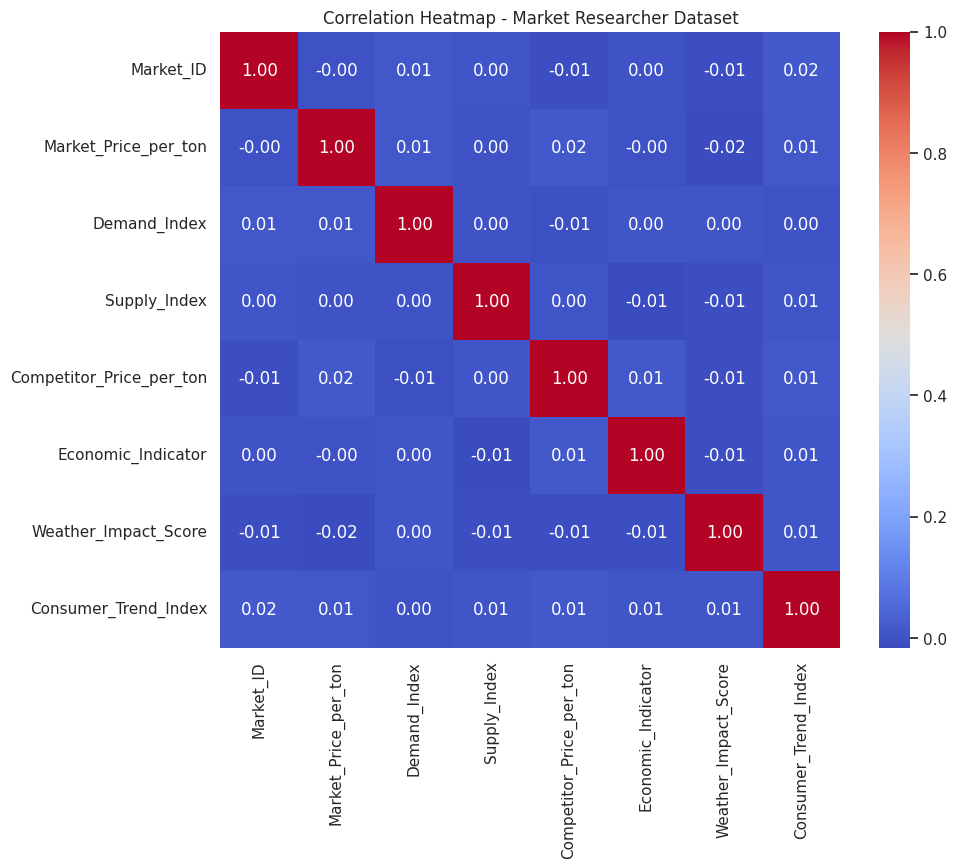

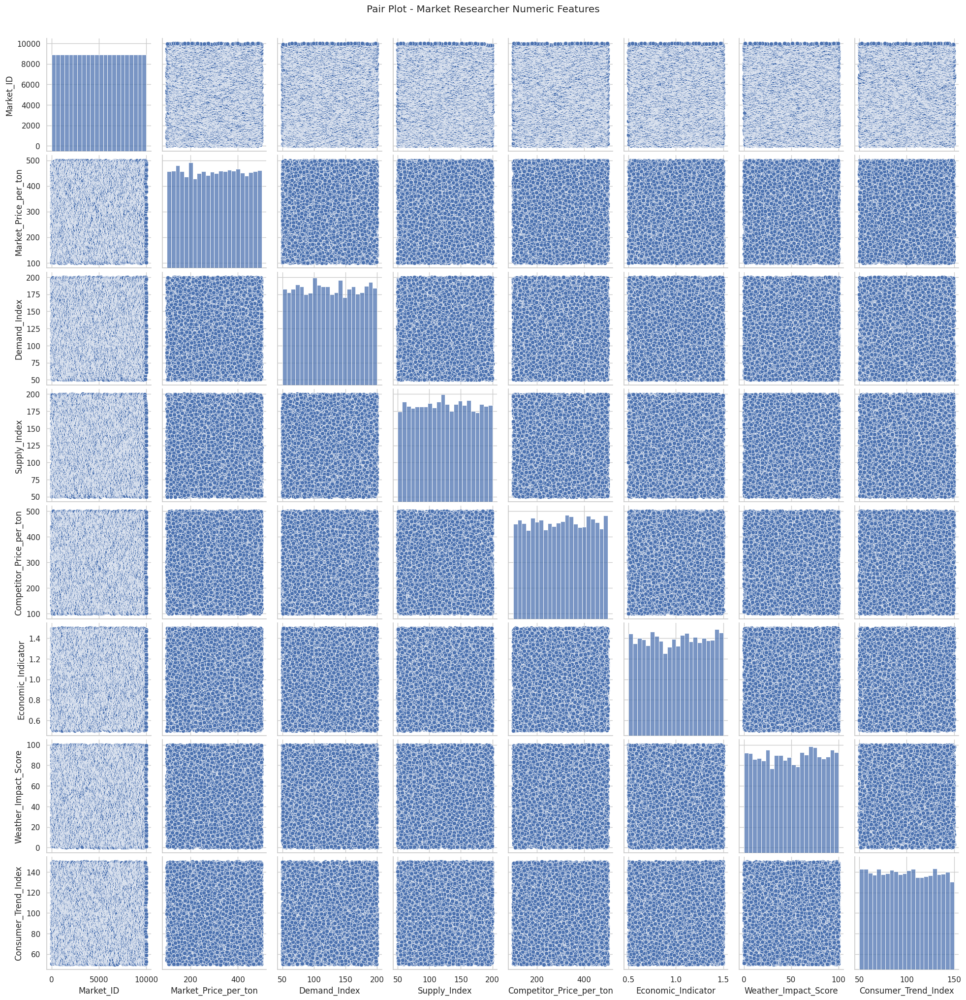

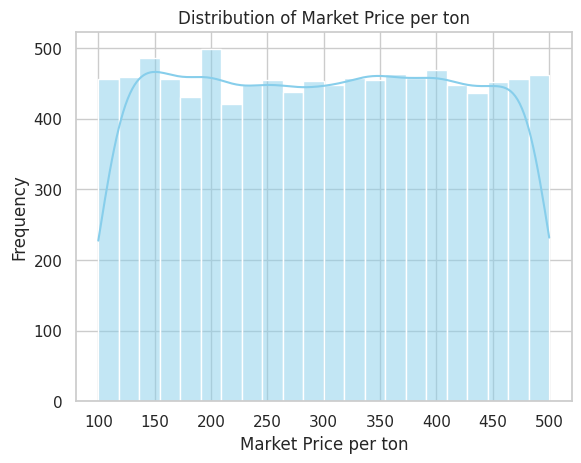

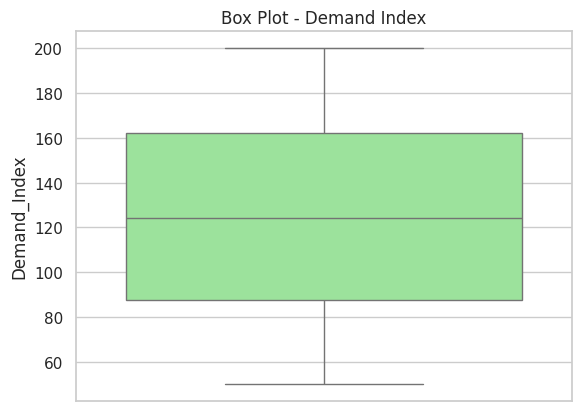

In [10]:
# Market Researcher Dataset EDA
# Let's only consider numeric columns for correlation purposes
numeric_market_df = market_df.select_dtypes(include=[np.number])

# Check if there are enough numeric columns for a correlation heatmap
if numeric_market_df.shape[1] >= 4:
    plt.figure(figsize=(10, 8))
    corr = numeric_market_df.corr()
    sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f')
    plt.title('Correlation Heatmap - Market Researcher Dataset')
    plt.show()
else:
    print('Not enough numeric columns for a correlation heatmap in the Market Researcher Dataset.')

# Pair plot of the numeric features (if dataset size permits)
sns.pairplot(numeric_market_df)
plt.suptitle('Pair Plot - Market Researcher Numeric Features', y=1.02)
plt.show()

# Histogram for Market_Price_per_ton to inspect its distribution
sns.histplot(market_df['Market_Price_per_ton'], kde=True, color='skyblue')
plt.title('Distribution of Market Price per ton')
plt.xlabel('Market Price per ton')
plt.ylabel('Frequency')
plt.show()

# Box plot to inspect potential outliers in Demand_Index
sns.boxplot(y=market_df['Demand_Index'], color='lightgreen')
plt.title('Box Plot - Demand Index')
plt.show()

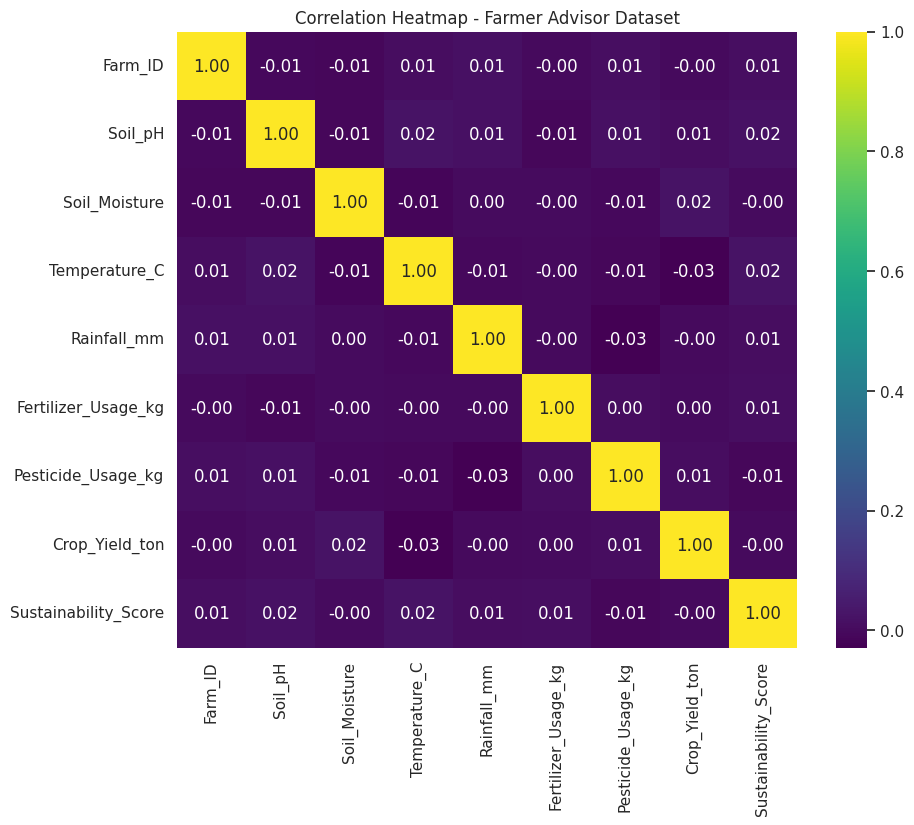

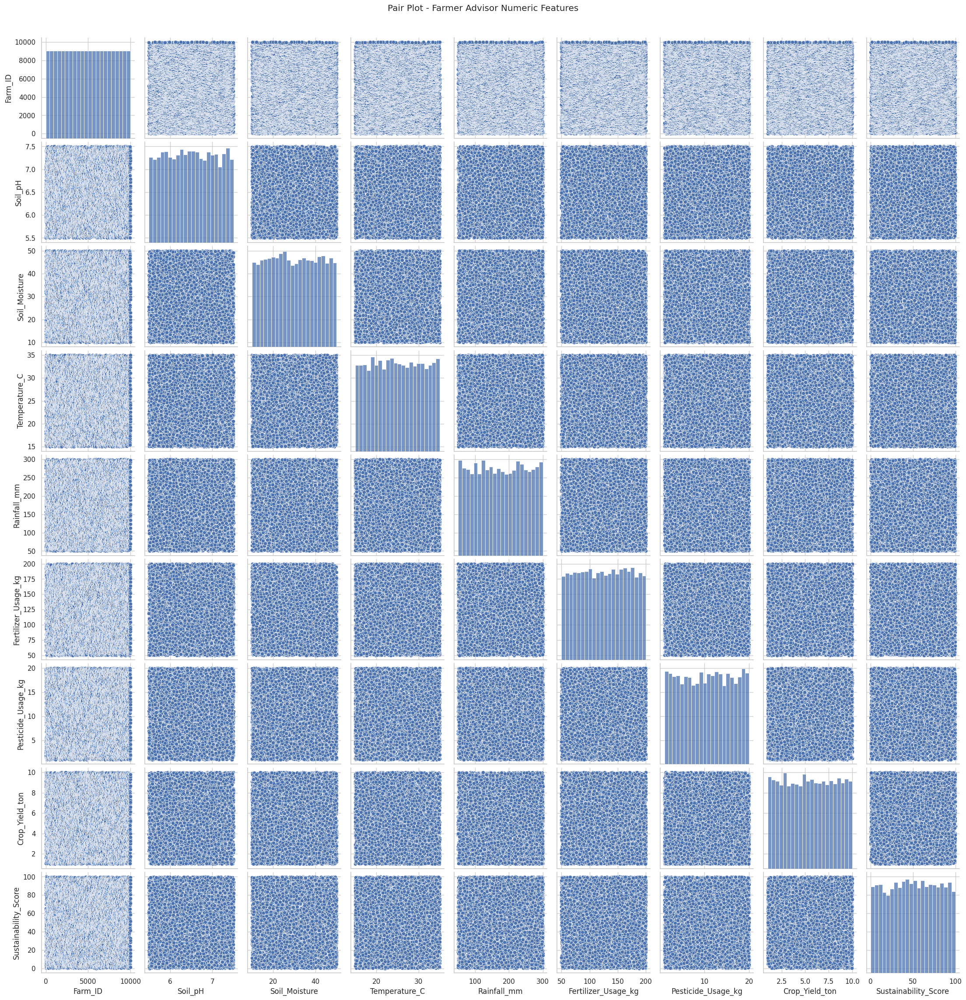

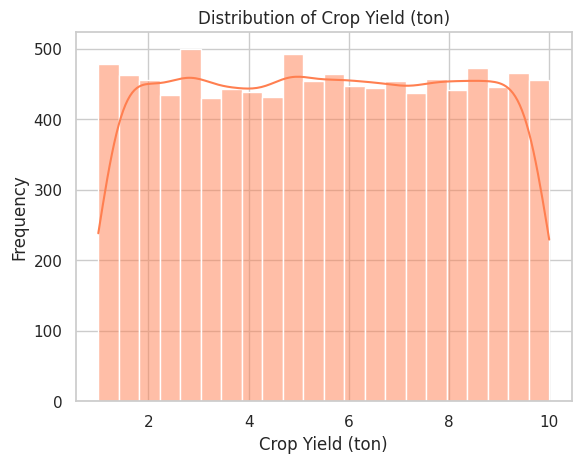

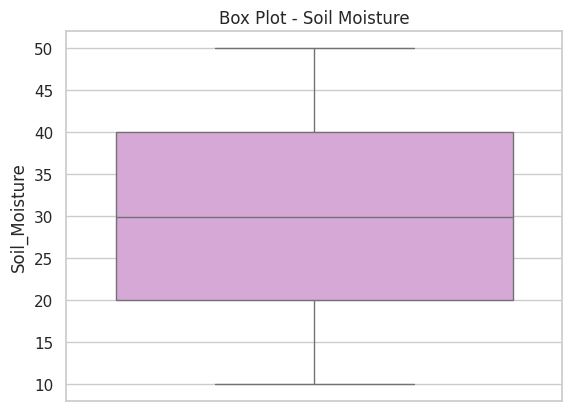

In [11]:
# Farmer Advisor Dataset EDA
# Let's only consider numeric columns for correlation
numeric_farmer_df = farmer_df.select_dtypes(include=[np.number])

if numeric_farmer_df.shape[1] >= 4:
    plt.figure(figsize=(10, 8))
    corr_farmer = numeric_farmer_df.corr()
    sns.heatmap(corr_farmer, annot=True, cmap='viridis', fmt='.2f')
    plt.title('Correlation Heatmap - Farmer Advisor Dataset')
    plt.show()
else:
    print('Not enough numeric columns for a correlation heatmap in the Farmer Advisor Dataset.')

# Pair plot for numeric features
sns.pairplot(numeric_farmer_df)
plt.suptitle('Pair Plot - Farmer Advisor Numeric Features', y=1.02)
plt.show()

# Histogram for Crop_Yield_ton to inspect the distribution of the target variable
sns.histplot(farmer_df['Crop_Yield_ton'], kde=True, color='coral')
plt.title('Distribution of Crop Yield (ton)')
plt.xlabel('Crop Yield (ton)')
plt.ylabel('Frequency')
plt.show()

# Box plot to inspect the range and outliers of Soil_Moisture
sns.boxplot(y=farmer_df['Soil_Moisture'], color='plum')
plt.title('Box Plot - Soil Moisture')
plt.show()

**Exploratory Data Analysis**

Exploratory Data Analysis (EDA) is a critical step in understanding agricultural datasets before building predictive models or making strategic decisions. In the realm of sustainable agriculture, EDA helps uncover patterns, detect anomalies, and identify relationships between key variables such as soil quality, rainfall, crop yields, pest outbreaks, and fertilizer usage.

Selected Features: ['Soil_pH', 'Soil_Moisture', 'Temperature_C', 'Rainfall_mm', 'Fertilizer_Usage_kg', 'Pesticide_Usage_kg', 'Sustainability_Score']
R^2 Score: 0.001
Mean Squared Error: 6.783


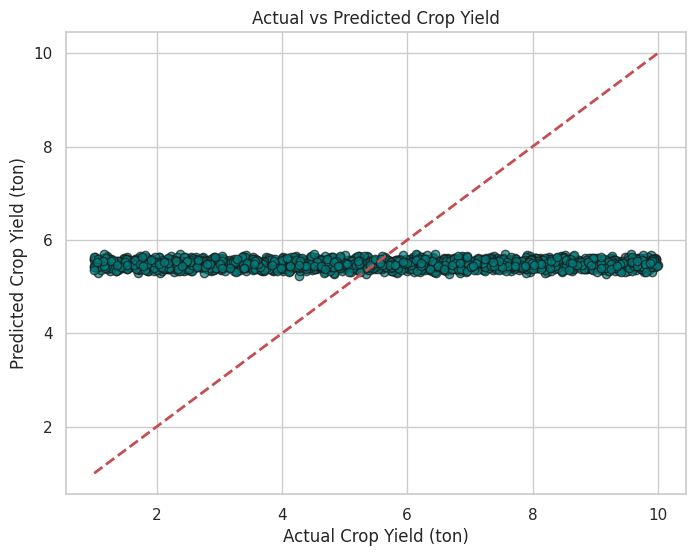

In [12]:
# Prepare the data for predictive modeling
# Selecting Features and Target
# In this model, the target is 'Crop_Yield_ton'
features = ['Soil_pH', 'Soil_Moisture', 'Temperature_C', 'Rainfall_mm', 'Fertilizer_Usage_kg', 'Pesticide_Usage_kg', 'Sustainability_Score']

# Verify that these columns exist in the farmer_df
print('Selected Features:', features)
X = farmer_df[features]
y = farmer_df['Crop_Yield_ton']
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Build a simple linear regression model
model = LinearRegression()
model.fit(X_train, y_train)
# Make predictions on the test set
y_pred = model.predict(X_test)
# Compute performance metrics
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
print(f'R^2 Score: {r2:.3f}')
print(f'Mean Squared Error: {mse:.3f}')
# Plot the predicted vs actual values
plt.figure(figsize=(8,6))
plt.scatter(y_test, y_pred, color='teal', edgecolor='k', alpha=0.7)
plt.xlabel('Actual Crop Yield (ton)')
plt.ylabel('Predicted Crop Yield (ton)')
plt.title('Actual vs Predicted Crop Yield')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.show()